by Noel Araujo Moreira



Muito provavelmente você já tentou ficar rico na loteria, e tão provável quanto, você já buscou por dicas infalíveis para aumentar sua sorte na internet. Dentre as inúmeras dicas, não precisa demorar muito no Google para que você encontre algum **Esquema de Fechamento**, que é melhor entendido com um exemplo.

A loteria mais cobiçada é a Megasena, no qual é necessário acertar 6 entre 60 números, por um preço de RS 3.50 por aposta. Caso você deseje aumentar sua sorte, você pode apostar 8 números, contudo, você precisa pagar um valor proporcional ( R$ 98 ). A proposta dos esquemas de fechamento é diminuir esse valor total, e mesmo assim permitir ao jogador realizar uma aposta de 8 numeros.  
Nesse exemplo especifico, dados 8 numeros, existem 28 possíveis combinações contendo 6 dezenas. O esquema de fechamento propõe um subconjutno dessas 28 combinações, do qual você deverá realizar um bolão.


Existe infinitas tabelas de fechamento pela internet, mas qual deles apresenta algum benefício?

Essa é a pergunta que buscamos responder nesse tutorial, e para tal, usaremos a linguagem Julia aplicada a um esquema de fechamento da Lotofácil.  
Desejo mostrar a sintaxe básica para aqueles que nunca tiveram contato com a linguagem, de forma a exibir sua similaridade com Python e Matlab, e ao mesmo tempo permitir que o leitor faça uma simulação que agregue valor ao seu dia a dia.




# Leitura de dados

O passo inicial para analisar dados, é ter a leitura dos dados. Em Julia, a leitura de dados "simples" (dados tabulados) é feita nativamente com o comando 'readdlm'.  A seguir, faremos a leitura de todos os resultados da lotofacil que esta armazenada em um arquivo CSV. Para fins didáticos, o endereço do arquivo é concatenado com seu nome, através do simbolo '$' .


In [1]:
using DelimitedFiles # readdlm esta contido no pacote DelimitedFiles

# altere o string abaixo com o caminho respectivo
caminho = "/caminho/da/pasta/no/seu/PC"

# informo a função readdlm
# que o arquivo é delimitado por virgula, 
# e contém apenas numeros inteiros
resultados = readdlm("$caminho/loto_facil_1707.csv",',',Int)

1707×15 Array{Int64,2}:
 12  21   2  18  17  25  11  22  10  13  23   9   5  16  19
  9   2   4   3   7  12  15  13   5  17  21  18   8  20  14
 24  20  18  14  19   3  21   4   2  12   9  23   5  16  17
  7  18   9   6   2   4  16  20  22  13  14  19  12  10  11
 22  18   1  16   9   8  13  17   3  19  14  10   6  12  15
 15  10   3   4   7  17  18  14  25   5  22  19  16  11   8
  8   6   1  22   2  17   5  16  21   3  10   7  18  13  20
  2   8   6  23  24  13  16  12   1  21   7   3  22  14  20
  6  21  23  15   8  13  24   9  16  25  10  19   4  14   5
 18  20  14   3   2  16   8  19  25  22   9  13   5  21   4
 24  23  20   6  22  21   3  10  13  19  25   4   7  18  17
  8  12  18  17  10  16   4   5  19  24   7   2  13  14  23
 21  13  14  17  22  23   4   9   1  24  18  11   5  25  20
  ⋮                   ⋮                   ⋮                
 11   5  25   1   9   8  16   4   7  24  17   2  12  14  10
 24   9   8  19  20  22   6  10  11  16   7  25  23   2  12
 24  19   8  23 

Após a leitura dos resultados, desejo que a primeira linha do array "resultados" contenha o primeiro resultado da lotofacil. Para tal, é necessário inverter a matriz, isto é, a última linha deverá ser a primeira e etc. De forma similar ao Matlab Acessamos o último item com "end", o penúltimo com "end-1".


In [2]:
resultados = resultados[end:-1:1,:]

1707×15 Array{Int64,2}:
 18  20  25  23  10  11  24  14   6   2  13   9   5  16   3
 23  15   5   4  12  16  20   6  11  19  24   1   9  13   7
 20  23  12   8   6   1   7  11  14   4  16  10   9  17  24
 16   5  25  24  23   8  12   2  17  18   1  10   4  19  13
 15  13  20   2  11  24   9  16   4  23  25  12   8  19   1
 23  19   1   5   7  21  16  10  15  25   6   2  12   4  17
 22   4  15   8  16  14  21  23  12   1  25  19   7  10  18
 19  16  18   9  13   8   5  25  17  10   6  15   1  22  20
 21   4  17   5   3  13  16   9  20  24  25  19  11  15  10
 24  19   8  23   6   2  20  11   9   3   4  10   5  12  14
 24   9   8  19  20  22   6  10  11  16   7  25  23   2  12
 11   5  25   1   9   8  16   4   7  24  17   2  12  14  10
 13   6  10   5   8  14   3  11  16  15   9  17  19   7  23
  ⋮                   ⋮                   ⋮                
  8  12  18  17  10  16   4   5  19  24   7   2  13  14  23
 24  23  20   6  22  21   3  10  13  19  25   4   7  18  17
 18  20  14   3 

In [3]:
# mesmo procedimento para tabela de fechamento
fechamento = readdlm("$caminho/tabela_fechamento_lotofacil.csv",',',Int)


6×15 Array{Int64,2}:
 1  2  3  4  5   6   7   8   9  10  11  12  13  14  15
 1  2  3  4  5   6   7   8   9  10  16  17  18  19  20
 1  2  3  4  5   6   7   8   9  10  21  22  23  24  25
 1  2  3  4  5  11  12  13  14  15  16  17  18  19  20
 1  2  3  4  5  11  12  13  14  15  21  22  23  24  25
 1  2  3  4  5  16  17  18  19  20  21  22  23  24  25

#  Pacotes

Oficialmente, existe um lista de pacotes registrados. A lista pode ser encontrado em:

https://pkg.julialang.org/

Esses são as bibliotecas que podem ser baixados diretamente pelo gerenciador de pacotes interno de Julia. A utilização é simples, e já foi demonstrada na primeira linha de código desse texto em `using DelimitedFiles`

A seguir usarei pacote `StatsBase` para gerar números aleatórios não repetidos. Esse pacote não é instalado por padrão, e há para sua instalação 2 maneiras

* Use o pacote `Pkg` : `using Pkg` + `Pkg.add("StatsBase")`
* Caso esteja usando o terminal, acesse o modo de instalação de programas através da tecla `]`, e escreva `add StatsBase`
    *  Existem 3 modos de operação em Julia, mas não se preocupem com eles nesse tutorial

O que vocẽ deve ser lembrar é ao usa um pacote pela primeira vez, ele vai demorar para compilar. Isso mesmo, julia é uma linguagem compilada. 

Quando você carrega um pacote, cria uma função, etc, etc, julia vai compilar um código específico para o tipo de entrada/saída que você fornece. Isso permite uma versatilidade para o programador muito interessante, mas se você quer realizar uma computação simples (que é executado uma única vez), o tempo de compilação é significante. 

Ao carregar o pacote `StatsBase` ou `DelimitedFiles` você não deve ter percebido esse tempo de compilação, mas com certeza irá notar o tempo parar criar seu primeiro gráfico com o pacote `Plots`.

In [4]:
using StatsBase

# gera 21 numeros no intervalo [1,25], sem repetição
numeros_jogador = sample(1:25, 21, replace = false) 
println(numeros_jogador) # exibe texto no terminal


[3, 20, 25, 18, 21, 12, 17, 11, 16, 14, 23, 22, 1, 10, 6, 7, 8, 2, 4, 9, 13]


# Simulação

O objetivo dessa seção é testar a validade das tabelas de fechamento. Iremos supor que uma pessoa jogou na loteria, desde o primeiro concurso, usando algum esquema de fechamento, e desejamos saber: 
* Quantas vezes essa pessoa teria ganhado algum prêmio ?
* E quanto seria a relação investimento/retornos ?

Primeiro passo é definir uma função que receba contabiliza os acertos, baseado em uma matriz representando um bolão, e o resultado do sorteio. O tipo dos dados de entrada e saida são facultativa, porém, declarar o tipo de variável é uma otimização que aumenta desempenho do código. 


Diferente de Python, é necessario um `end`, tanto para definir uma função quanto para terminar um `for`. 

In [5]:
function contar_acertos(cartela, sorteio)
    return sum(diff(sort(vcat(cartela, sorteio)[:])) .== 0)
end


function contar_acertos(cartela, sorteio)
    return vcat(cartela, sorteio)[:] .== 0 |> sort |> diff |> sum
end


#=
Na função anterior, Julia consegue trabalhar com qualquer input
Agora, Julia sabe que a entrada serão dois Array de Inteiros,
e de saída será um Inteiro
Note que não é problema declarar duas funções com o mesmo nome.
=#
function contar_acertos(cartela::Array{Int64,1}, sorteio::Array{Int64,1})
    acertos::Int64 = 0
    acertos = sum(diff(sort(vcat(cartela, sorteio)[:])) .== 0)
    # poderia usar 'return acertos', mas Julia entente que a última linha 
    # terá o valor de retorno
    acertos 
end

contar_acertos (generic function with 2 methods)

Em Julia é muito conveniente usar o comando pipelining `|>`. Ele é um facilitador visual, permitindo que expressões cheias de parênteses sejam escritas de forma mais legível. Por exemplo, as duas expressões abaixo são equivalente


In [6]:
println(sin(abs(-2.88)) )
abs(-2.88) |> sin |> println

0.25861934966111083
0.25861934966111083


Agora que temos uma função para contabilizar acertos, partiremos para a computação principal desse tutorial.

Iremoss gerar números aleatórios para preencher a tabela de fechamento. Em seguida comparamos com os volantes do bolão com os números que foram sorteados na vida real. Repare que a sintaxe é similar ao Fortran/Matlab para manipular matrizes

In [7]:
qtd_sorteios = size(resultados,1) # qtd de linhas = qtd de sorteios

 # tamanho do bolão = qtd de linhas da tabela de fechamento
qtd_cartelas = size(fechamento,1)

# variavel que será usado fora do 'for-loop' 
# precisa ser definido fora do loop
acertos = zeros(qtd_sorteios, qtd_cartelas) 

# para encontrar apenas o valor máximo, use a função 'maximum()'
# para obter o valor E sua respectiva posição no Array, use 'findmax()'
N_dezenas = maximum(fechamento) # qtd de numeros utilizado no fechamento


# super recomendo que você instale Juno 
# http://junolab.org/
# for-loop pode ser integrado ao Juno com a macro '@progress'
# @progress for i = 1:qtd_sorteios
for i = 1:qtd_sorteios
    sorteio = resultados[i,:]

    numeros_jogador = sample(1:25, N_dezenas, replace = false)
    bolao = numeros_jogador[fechamento]
    # simbolos Unicode podem ser usadas como variaveis,
    # ou já possuem funções especificas, como o '∈' abaixo
    for j ∈ 1:qtd_cartelas # \in + tab = ∈
        cartela = bolao[j,:]
        acertos[i,j] = contar_acertos(cartela, sorteio)
        if acertos[i,j]==15
            println("!! Parabéns, vc ganhou !! ")
        end
    end
end


Exibiremos um histograma com a quantidade de acertos. Para criar figuras, existem várias bibliotecas, e `Plots.jl` unifica algumas delas. Para aqueles que já usaram Matplotlib, a sintaxe de `Plots` será bem familiar, além disso, desde que matplotlib esteja instalado no computador, ela poderá ser utilizada para gerar das figuras - requer a instalação do pacote `PyPlot`.

Para mais detalhes e exemplos, confira a documentação : http://docs.juliaplots.org/latest/


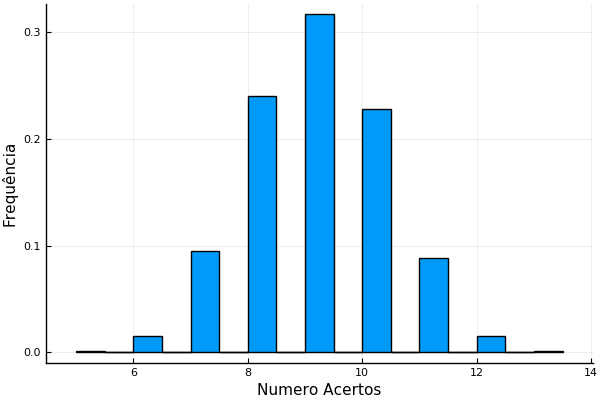

In [8]:
using Plots
pyplot() # desejo usar Matplotlib para gerar as figuras
histogram(acertos[:],
        nbins = 16,
        xlabel="Numero Acertos",
        ylabel="Frequência",
        legend=false,
        normalize = :probability)

Comparação de escalar com um vetor deve ser feito com o operador `broadcast`, como em Matlab, é um ponto `.` antes do nome da função

Por exemplo, `acertos[:] .== 1`, aplica a operação `==` sobre o vetor `acertos`

Em geral:
* Qualquer função definida para 1 entrada, como : sin(1)
* Podem ser expandidas usando broadcast : sin.([1,2,3])

Não podemos acessar as alturas do gráfico de forma similar ao Matlab (`h = histogram(acertos[:])`). Em Julia, gráficos retornam objetos gráficos. Para obter o mesmo dado contido no histograma podemos fazer um for-loop e quantificar os acertos, mas faremos isso com uma sintaxe familiar do mundo Python. 

In [9]:
# macro @show exibe um comando de forma estruturada

# criação de vetor similar ao Python
@show freq_acertos = [sum(acertos[:].==i) for i=11:15]; 
@show Ψ = freq_acertos/length(acertos[:]); # \Psi + tab

freq_acertos = [sum(acertos[:] .== i) for i = 11:15] = [901, 161, 10, 0, 0]
Ψ = freq_acertos / length(acertos[:]) = [0.0879711, 0.0157196, 0.000976372, 0.0, 0.0]


Para finalizar o tutorial, vamos verificar quanto dinheiro é investido em comparação ao retorno obtido. Obter o valor gasto é fácil, basta multiplicar o valor da aposta (R$ 2,00) pela quantidade de jogos realizada ( qtd_sorteios*qtd_cartelas ). 

Contudo, para cada acerto existe um associado prêmio associado, para 11 acertos são R$ 4,00, e etc. Para os prêmios fixos, usarei os valores atuais fornecidos pela _Caixa_, mas para os prêmios voláteis, serei simplista, e usarei um valor fixo abaixo do valor convencional, assim podemos ter certeza que o método de Fechamento possui eficácia mensurável mesmo em um cenário mais desvantajoso.

Dado o array `freq_acertos` basta multiplicar por um array contendo os prêmios esperados - definido abaixo.

In [10]:
# Numeros podem ser escritos com '_' para melhor leitura de casas decimais
# exemplo: 1/1_000_000 == 0.000_001 == 1e-6
valor_premios = [4, 8, 20, 1_500, 300_000]

5-element Array{Int64,1}:
      4
      8
     20
   1500
 300000

**Um alerta aos novos usuarios**

* `[4, 8, 20, 1_500, 300_000]` é um vetor coluna do tipo `Array{Int64,1}`
* `[4 8 20 1_500 300_000]'` é uma matriz com apenas uma coluna do tipo `Array{Int64,2}`

Para os leitores familiares com Matlab, isso não seria uma diferença relevante, pois no Matlab tudo é considerado uma matriz. Em Julia um Array e uma Matriz com uma coluna possuem diferença fundamental, e essa será a provável causa de muitos erros aos novatos. Quando isso acontecer, você terá um mensagem de erro similar a :

`Function X is not defined to type Array{Int64,2}`

Para fazer a conversão, use o comando `vec()`  
`vec([4 8 20 1_500 300_000]')` == `[4, 8, 20, 1_500, 300_000]`


Dando continuidade ao tutorial, calcularemos a quantidade total em prêmios efetuando um produto escalar de forma explicita, usando a função `dot` para apresentar o pacote `LinearAlgebra`. Por último, usaremos 3 maneiras de apresentar os resultados, o `println` faz o que você espera, exibe textos. Mas para aqueles que são apegados ao `printf` do C, existe um pacote que permite usá-lo.

In [11]:
# dot() = produto escalar, poderia fazer "retornos = freq_acertos'*valor_premios"
using LinearAlgebra # necessario para a função dot()
retornos = dot(freq_acertos,valor_premios)
investimentos = qtd_cartelas*qtd_sorteios*2 # 2 reais o valor de cada cartela com 15 numeros

println( "estimativa ganho : ", retornos , " reais")
println( "estimativa gasto : $investimentos reais"  )
println("razao ganho/gasto : ", round(retornos/investimentos, digits=3))

# macro para usuarios de C que gostam do printf
# using Printf
# @printf("razao ganho/gasto : %.3f", retornos/investimentos)

estimativa ganho : 5092 reais
estimativa gasto : 20484 reais
razao ganho/gasto : 0.249


O resultado "0.249" (24.9%) deve ser interpretado corretamente: **Em longo prazo, você tem um prejuízo em torno de 75%**. 

A menos que você já seja uma pessoa de sorte na loteria, alguma tabela de Fechamento que você encontrar na internet não lhe trará beneficios.

